# Definitions

In [29]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
os.environ['OMP_NUM_THREADS'] = '8'
import matplotlib
import math
from matplotlib import pyplot as plt
import numpy as np
import euclidemu2
import scipy
import cosmolike_lsst_y1_interface as ci
from getdist import IniFile
from scipy.interpolate import interp1d
import itertools
import iminuit
import functools
print(sys.version)
print(os.getcwd())

# GENERAL PLOT OPTIONS
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
matplotlib.rcParams['xtick.bottom'] = True
matplotlib.rcParams['xtick.top'] = False
matplotlib.rcParams['ytick.right'] = False
matplotlib.rcParams['axes.edgecolor'] = 'black'
matplotlib.rcParams['axes.linewidth'] = '1.0'
matplotlib.rcParams['axes.labelsize'] = 'medium'
matplotlib.rcParams['axes.grid'] = True
matplotlib.rcParams['grid.linewidth'] = '0.0'
matplotlib.rcParams['grid.alpha'] = '0.18'
matplotlib.rcParams['grid.color'] = 'lightgray'
matplotlib.rcParams['legend.labelspacing'] = 0.77
matplotlib.rcParams['savefig.bbox'] = 'tight'
matplotlib.rcParams['savefig.format'] = 'pdf'
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# BE CAREFUL: you need texlive-latex-base texlive-latex-extra texlive-fonts-recommended dvipng ghostscript cm-super
matplotlib.rcParams['text.usetex'] = True
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------------------------

# Jupyter Notebook Display options
import IPython
IPython.display.display(IPython.display.HTML("<style>:root { --jp-notebook-max-width: 85% !important; }</style>"))
IPython.display.display(IPython.display.HTML("<style>div.output_scroll { height: 54em; }</style>"))

3.10.17 | packaged by conda-forge | (main, Apr 10 2025, 22:19:12) [GCC 13.3.0]
/home/vivianmiranda/2025/cocoa/Cocoa/projects/lsst_y1


In [7]:
# IMPORT CAMB
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/CAMB/build/lib.linux-x86_64-'+os.environ['PYTHON_VERSION'])
import camb
from camb import model
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))

# IMPORT SHARED NOTEBOOK UTILITIES (cosmolike_core)
sys.path.insert(0, os.environ['ROOTDIR']+'/external_modules/code/cosmolike_core')
import cosmolike_notebook_utils as cnu
print('Using cosmolike_notebook_utils installed at %s'%(os.path.dirname(cnu.__file__)))


Using CAMB 1.5.9 installed at /home/vivianmiranda/2025/cocoa/Cocoa/.local/lib/python3.10/site-packages/camb


In [8]:
CAMBAccuracyBoost = 1.0
non_linear_emul = 2
CLprobe="3x2pt"

path= "../../external_modules/data/lsst_y1"
data_file="lsst_y1_M1_GGL0.05.dataset"

IA_model = 0
IA_redshift_evolution = 3
IA_code = 0  # 0 = C FASTPT, 1 = Python FAST-PT (NLA always uses 0)

ntheta = 26 
theta_min_arcmin = 2.5 
theta_max_arcmin = 900

In [9]:
As_1e9 = 2.1
ns = 0.96605
H0 = 67.32
omegab = 0.04
omegam = 0.3
mnu = 0.06
LSST_DZ_S1 = 0.0414632
LSST_DZ_S2 = 0.00147332
LSST_DZ_S3 = 0.0237035
LSST_DZ_S4 = -0.0773436
LSST_DZ_S5 = -8.67127e-05
LSST_M1 = 0.0191832
LSST_M2 = -0.0431752
LSST_M3 = -0.034961
LSST_M4 = -0.0158096
LSST_M5 = -0.0158096
LSST_A1_1 = 0.606102
LSST_A1_2 = -1.51541
LSST_DZ_L1 = 0.00457604
LSST_DZ_L2 = 0.000309875
LSST_DZ_L3 = 0.00855907
LSST_DZ_L4 = -0.00316269
LSST_DZ_L5 = -0.0146753 
LSST_B1_1 = 1.72716
LSST_B1_2 = 1.65168
LSST_B1_3 = 1.61423
LSST_B1_4 = 1.92886
LSST_B1_5 = 2.11633
LSST_PM_1 = 0.0
LSST_PM_2 = 0.0
LSST_PM_3 = 0.0
LSST_PM_4 = 0.0
LSST_PM_5 = 0.0
w0pwa = -0.9
w = -0.9

In [10]:
# get_camb_cosmology lives in cosmolike_core, shared by every project's
# notebooks; call it as cnu.get_camb_cosmology (imported above). The
# shared version scales the chi(z) node count with the CAMB boost
# (this notebook's copy fixed it at 1250, identical at boost 1);
# this notebook's kmax choice of 5.0 is passed explicitly at the
# call sites that relied on the old default.


In [11]:
def C_gs_tomo_limber(ell, 
                     omegam = omegam, 
                     omegab = omegab, 
                     H0 = H0, 
                     ns = ns, 
                     As_1e9 = As_1e9, 
                     w = w, 
                     w0pwa = w0pwa,
                     A1  = [LSST_A1_1, LSST_A1_2, 0, 0, 0], 
                     A2  = [0, 0, 0, 0, 0],
                     BTA = [0, 0, 0, 0, 0],
                     shear_photoz_bias = [LSST_DZ_S1, LSST_DZ_S2, LSST_DZ_S3, LSST_DZ_S4, LSST_DZ_S5],
                     M = [LSST_M1, LSST_M2, LSST_M3, LSST_M4, LSST_M5],
                     lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
                     galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
                     galaxy_bias_b2 = [0,0,0,0,0],
                     galaxy_bias_bmag = [0,0,0,0,0],
                     galaxy_bias_b3nl = [0,0,0,0,0],
                     galaxy_bias_bk = [0,0,0,0,0],
                     baryon_sims = None,
                     AccuracyBoost = 1.0, 
                     kmax=5.0, 
                     k_per_logint=10,  
                     CAMBAccuracyBoost=1.0,
                     CLAccuracyBoost = 1.0, 
                     CLIntegrationAccuracy = 0,
                     non_linear_emul=non_linear_emul):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(CLAccuracyBoost-1.0))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_shear_calib(M = M)
    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)
    ci.set_nuisance_ia(A1 = A1, A2 = A2, B_TA = BTA)
    
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)
   

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return ci.C_gs_tomo_limber(l = ell)

In [12]:
def C_gg_tomo(ell,
              limber,
              omegam = omegam, 
              omegab = omegab, 
              H0 = H0, 
              ns = ns, 
              As_1e9 = As_1e9, 
              w = w, 
              w0pwa = w0pwa,
              lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
              galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
              galaxy_bias_b2 = [0,0,0,0,0],
              galaxy_bias_bmag = [0,0,0,0,0],
              galaxy_bias_b3nl = [0,0,0,0,0],
              galaxy_bias_bk = [0,0,0,0,0],
              baryon_sims = None,
              AccuracyBoost = 1.0, 
              kmax=5.0, 
              k_per_logint=10, 
              CAMBAccuracyBoost=1.0,
              CLAccuracyBoost = 1.0, 
              CLIntegrationAccuracy = 0,
              non_linear_emul=non_linear_emul):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(CLAccuracyBoost-1.0))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_bias(bias_model=[0,0,0,1,0]) 
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)
    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)

    if limber == 1:
        return ci.C_gg_tomo_limber(l = ell)
    else:
        return ci.C_gg_tomo(l = ell)

In [13]:
def gamma_t(ntheta = ntheta, 
            theta_min_arcmin = theta_min_arcmin, 
            theta_max_arcmin = theta_max_arcmin,
            omegam = omegam, 
            omegab = omegab, 
            H0 = H0, 
            ns = ns, 
            As_1e9 = As_1e9, 
            w = w, 
            w0pwa = w0pwa,
            A1  = [LSST_A1_1, LSST_A1_2, 0, 0, 0], 
            A2  = [0, 0, 0, 0, 0],
            BTA = [0, 0, 0, 0, 0],
            shear_photoz_bias = [LSST_DZ_S1, LSST_DZ_S2, LSST_DZ_S3, LSST_DZ_S4, LSST_DZ_S5],
            M = [LSST_M1, LSST_M2, LSST_M3, LSST_M4, LSST_M5],
            lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
            galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
            galaxy_bias_b2 = [0,0,0,0,0],
            galaxy_bias_bmag = [0,0,0,0,0],
            galaxy_bias_b3nl = [0,0,0,0,0],
            galaxy_bias_bk = [0,0,0,0,0],
            PM = [LSST_PM_1, LSST_PM_2, LSST_PM_3, LSST_PM_4, LSST_PM_5],
            baryon_sims = None,
            AccuracyBoost = 1.0, 
            kmax=5.0, 
            k_per_logint=10,
            CAMBAccuracyBoost=1.0,
            CLAccuracyBoost = 1.0, 
            CLIntegrationAccuracy = 0,
            non_linear_emul=non_linear_emul):
        
    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(CLAccuracyBoost-1.0))
    ci.init_ntable_lmax(int(50000+10000*CLAccuracyBoost))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_binning(int(ntheta), theta_min_arcmin, theta_max_arcmin)
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_shear_calib(M = M)
    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)
    ci.set_nuisance_ia(A1 = A1, A2 = A2, B_TA = BTA)
    ci.set_point_mass(PMV=PM) 

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)
    
    return (ci.get_binning_real_space(), ci.w_gammat_tomo())  

In [34]:
def w_theta(ntheta = ntheta, 
            theta_min_arcmin = theta_min_arcmin, 
            theta_max_arcmin = theta_max_arcmin,
            omegam = omegam, 
            omegab = omegab, 
            H0 = H0, 
            ns = ns, 
            As_1e9 = As_1e9, 
            w = w, 
            w0pwa = w0pwa,
            lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
            galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
            galaxy_bias_b2 = [0,0,0,0,0],
            galaxy_bias_bmag = [0,0,0,0,0],
            galaxy_bias_b3nl = [0,0,0,0,0],
            galaxy_bias_bk = [0,0,0,0,0],
            baryon_sims = None,
            AccuracyBoost = 1.0, 
            kmax=5.0, 
            k_per_logint=10, 
            CAMBAccuracyBoost=1.0,
            CLAccuracyBoost=1.0, 
            CLIntegrationAccuracy = 0,
            non_linear_emul=non_linear_emul):

    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(AccuracyBoost-1.0))
    ci.init_ntable_lmax(int(50000+10000*CLAccuracyBoost))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))
    ci.init_binning(int(ntheta), theta_min_arcmin, theta_max_arcmin)
    ci.init_bias(bias_model=[0,0,0,1,0])
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)
    
    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)
    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)

    if baryon_sims is None:
        ci.reset_bary_struct()
    else:
        ci.init_baryons_contamination(sim = baryon_sims)

    result = (ci.get_binning_real_space(), ci.w_gg_tomo())  
    return result 

In [35]:
def plot_C_gs_tomo_limber(ell, C_gs, C_gs_ref = None, param = None, colorbarlabel = None, lmin = 30, lmax = 1500, 
                          cmap = 'gist_rainbow', ylim = [0.75,1.25], linestyle = None, linewidth = None,
                          legend = None, legendloc = (0.6,0.78), yaxislabelsize = 16, yaxisticklabelsize = 10, 
                          xaxisticklabelsize = 20, bintextpos = [0.2, 0.85], bintextsize = 15, figsize = (20, 12), 
                          show = 1, colorbar=1):

    nell, nlens, nsource = C_gs[0].shape
    if nell != len(ell):
        print("Bad Input (number of ell)")
        return 0
    
    if not (C_gs_ref is None):
        nell2, nlens2, nsource2 = C_gs_ref.shape
        if (nlens != nlens2) or (nell != nell2) or (nsource != nsource2):
            print("Bad Input")
            print(f"Nlens = {nlens}, Nlens_REF = {nlens2}")
            print(f"Nsource = {nsource}, Nsource_REF = {nsource2}")
            print(f"Nell = {nell}, Nell_REF = {nell2}")
            return 0   

    if C_gs_ref is None:
        fig, axes = plt.subplots(
            nrows = nlens, 
            ncols = nsource, 
            figsize = figsize, 
            sharex = True, 
            sharey = False, 
            gridspec_kw = {'wspace': 0.275, 'hspace': 0.135})
    else:
        fig, axes = plt.subplots(
            nrows = nlens, 
            ncols = nsource, 
            figsize = figsize, 
            sharex = True, 
            sharey = True, 
            gridspec_kw = {'wspace': 0, 'hspace': 0})
    
    cm = plt.get_cmap(cmap)
    
    if not (param is None or colorbar is None):
        cb = fig.colorbar(
            matplotlib.cm.ScalarMappable(norm = matplotlib.colors.Normalize(param[0], param[-1]), cmap = cmap), 
            ax = axes.ravel().tolist(), 
            orientation = 'vertical', 
            aspect = 50, 
            pad = 0.03, 
            shrink = 0.5)
        if not (colorbarlabel is None):
            cb.set_label(label = colorbarlabel, size = 20, weight = 'bold', labelpad = 2)
        if len(param) != len(C_gs):
            print("Bad Input")
            return 0

    if not (linestyle is None):
        linestylecycler = itertools.cycle(linestyle)
    else:
        linestylecycler = itertools.cycle(['solid'])

    if not (linewidth is None):
        linewidthcycler = itertools.cycle(linewidth)
    else:
        linewidthcycler = itertools.cycle([1.0])
    
    for i in range(nlens):
        for j in range(nsource):
            clmin = []
            clmax = []
            for Cl in C_gs:  
                tmp = Cl[:,i,j]
                clmin.append(np.min(tmp))
                clmax.append(np.max(tmp))
 
            axes[j,i].set_xlim([lmin, lmax])
            
            if C_gs_ref is None:
                axes[j,i].set_ylim([np.min(ylim[0]*np.array(clmin)), np.max(ylim[1]*np.array(clmax))])
                axes[j,i].set_yscale('log')
            else:
                tmp = np.array(ylim) - 1
                axes[j,i].set_ylim(tmp.tolist())
                axes[j,i].set_yscale('linear')
                
            axes[j,i].set_xscale('log')
            
            if i == 0:
                if C_gs_ref is None:
                    axes[j,i].set_ylabel("$|C_{\ell}^{gs}|$", fontsize=yaxislabelsize)
                else:
                    axes[j,i].set_ylabel("frac. diff.", fontsize=yaxislabelsize)
            for item in (axes[j,i].get_yticklabels()):
                item.set_fontsize(yaxisticklabelsize)
            for item in (axes[j,i].get_xticklabels()):
                item.set_fontsize(xaxisticklabelsize)
            
            if j == nsource-1:
                axes[j,i].set_xlabel("$\ell$", fontsize=16)
            
            axes[j,i].text(bintextpos[0], bintextpos[1], 
                "$(" +  str(i+1) + "," +  str(j+1) + ")$", 
                horizontalalignment = 'center', 
                verticalalignment = 'center',
                fontsize = bintextsize,
                usetex = True,
                transform = axes[j,i].transAxes)
            
            for x, Cl in enumerate(C_gs):
                if C_gs_ref is None:
                    tmp = Cl[:,i,j]
                else:
                    tmp = Cl[:,i,j] / C_gs_ref[:,i,j] - 1
                axes[j,i].plot(ell, 
                               tmp, 
                               color=cm(x/len(C_gs)), 
                               linewidth=next(linewidthcycler), 
                               linestyle=next(linestylecycler))

    if not (legend is None):
        if len(legend) != len(C_gs):
            print("Bad Input")
            return 0
        fig.legend(
            legend, 
            loc=legendloc,
            borderpad=0.1,
            handletextpad=0.4,
            handlelength=1.5,
            columnspacing=0.35,
            scatteryoffsets=[0],
            frameon=False)

    if not (show is None):
        fig.show()
    else:
        return (fig, axes)

In [36]:
def plot_C_gg_tomo(ell, C_gg, C_gg_ref = None, param = None, colorbarlabel = None, lmin = 30, lmax = 1500, 
                   cmap = 'gist_rainbow', ylim = [0.75,1.25], linestyle = None, linewidth = None,
                   legend = None, legendloc = (0.6,0.78), yaxislabelsize = 16, yaxisticklabelsize = 10, 
                   xaxisticklabelsize = 20, bintextpos = [0.2, 0.85], bintextsize = 15, figsize = (20, 12), 
                   show = 1, forcelinearyscale=False, overwriteylabel=None, forcelinearxscale=False,
                   marker = None, markersize=3, colorbar=1):

    nell, nlens1, nlens2 = C_gg[0].shape   
    if nlens1 != nlens2:
        print("Bad Input (number of nlens1/nlens2)")
        return 0
    if nell != len(ell):
        print("Bad Input (number of ell)")
        return 0
    if not (C_gg_ref is None):
        nell2, nlens3, nlens4 = C_gg_ref.shape
        if nlens3 != nlens4:
            print("Bad Input (number of nlens3/nlens4)")
            return 0
        if (nlens1 != nlens3) or (nell != nell2):
            print("Bad Input")
            print(f"Nlens  = {nlens1}, Nlens_REF = {nlens3}")
            print(f"Nell = {nell}, Nell_REF = {nell2}")
            return 0   
    
    if C_gg_ref is None:
        fig, axes = plt.subplots(
            nrows = 1, 
            ncols = nlens1, 
            figsize = figsize, 
            sharex = True, 
            sharey = False, 
            gridspec_kw = {'wspace': 0.275, 'hspace': 0.135})
    else:
        fig, axes = plt.subplots(
            nrows = 1, 
            ncols = nlens1, 
            figsize = figsize, 
            sharex = True, 
            sharey = True, 
            gridspec_kw = {'wspace': 0, 'hspace': 0})
    
    cm = plt.get_cmap(cmap)
    
    if not (param is None or colorbar is None):
        cb = fig.colorbar(
            matplotlib.cm.ScalarMappable(norm = matplotlib.colors.Normalize(param[0], param[-1]), cmap = cmap), 
            ax = axes.ravel().tolist(), 
            orientation = 'vertical', 
            aspect = 50, 
            pad = 0.03, 
            shrink = 1.0)
        if not (colorbarlabel is None):
            cb.set_label(label = colorbarlabel, size = 20, weight = 'bold', labelpad = 2)
        if len(param) != len(C_gg):
            print("Bad Input")
            return 0

    if not (marker is None):
        markercycler = itertools.cycle(marker)     
    if not (linestyle is None):
        linestylecycler = itertools.cycle(linestyle)
    else:
        linestylecycler = itertools.cycle(['solid'])
    if not (linewidth is None):
        linewidthcycler = itertools.cycle(linewidth)
    else:
        linewidthcycler = itertools.cycle([1.0])
    
    for i in range(nlens1):
        clmin = []
        clmax = []
        for Cl in C_gg:  
            tmp = Cl[:,i,i]
            clmin.append(np.min(tmp))
            clmax.append(np.max(tmp))

        axes[i].set_xlim([lmin, lmax])
        
        if C_gg_ref is None:
            axes[i].set_ylim([np.min(ylim[0]*np.array(clmin)), np.max(ylim[1]*np.array(clmax))])
            axes[i].set_yscale('log')
            if forcelinearyscale == True:
                axes[i].set_yscale('linear')
        else:
            tmp = np.array(ylim) - 1
            axes[i].set_ylim(tmp.tolist())
            axes[i].set_yscale('linear')
            
        axes[i].set_xscale('log')
        if forcelinearxscale == True:
            axes[i].set_xscale('linear')
        
        if i == 0:
            if C_gg_ref is None:
                axes[i].set_ylabel("$C_{\ell}^{gg}$",fontsize=yaxislabelsize)
                if not (overwriteylabel is None):
                    axes[i].set_ylabel(overwriteylabel,fontsize=yaxislabelsize)
            else:
                axes[i].set_ylabel("frac. diff.",fontsize=yaxislabelsize)
                if not (overwriteylabel is None):
                    axes[i].set_ylabel(overwriteylabel,fontsize=yaxislabelsize)
        
        for item in (axes[i].get_yticklabels()):
            item.set_fontsize(yaxisticklabelsize)
        for item in (axes[i].get_xticklabels()):
            item.set_fontsize(xaxisticklabelsize)
        
        axes[i].set_xlabel("$\ell$", fontsize=16)
        
        axes[i].text(bintextpos[0], bintextpos[1], 
            "$(" +  str(i+1) + ")$", 
            horizontalalignment = 'center', 
            verticalalignment = 'center',
            fontsize = bintextsize,
            usetex = True,
            transform = axes[i].transAxes)
        
        for x, Cl in enumerate(C_gg):
            if C_gg_ref is None:
                tmp = Cl[:,i,i]
            else:
                tmp = Cl[:,i,i] / C_gg_ref[:,i,i] - 1
            
            if marker is None:
                axes[i].plot(ell, 
                             tmp, 
                             color=cm(x/len(C_gg)), 
                             linewidth=next(linewidthcycler), 
                             linestyle=next(linestylecycler))
            else:
                axes[i].plot(ell, 
                             tmp, 
                             color=cm(x/len(C_gg)), 
                             markerfacecolor='None',
                             marker=next(markercycler),
                             markeredgecolor=cm(x/len(C_gg)),
                             linestyle='None',
                             markersize=markersize)
    
    if not (legend is None):
        if len(legend) != len(C_gg):
            print("Bad Input")
            return 0
        fig.legend(
            legend, 
            loc=legendloc,
            borderpad=0.1,
            handletextpad=0.4,
            handlelength=1.5,
            columnspacing=0.35,
            scatteryoffsets=[0],
            frameon=False)

    if not (show is None):
        fig.show()
    else:
        return (fig, axes)

In [37]:
def plot_gammat_tomo_limber(theta_gammat, gammat_ref = None, param = None, colorbarlabel = None, marker = None, 
                            linestyle = None, linewidth = None, ylim = [0.75,1.25],
                            cmap = 'gist_rainbow', legend = None, legendloc = (0.6,0.78), yaxislabelsize = 16, 
                            yaxisticklabelsize = 10,  xaxisticklabelsize = 20, bintextpos = [0.2, 0.85], 
                            bintextsize = 15, figsize = (12, 12), show = 1, colorbar=1):

    (theta, gammat) = theta_gammat[0]
    ntheta, nlens, nsource = gammat.shape
    
    if ntheta != len(theta):
        print("Bad Input (theta)")
        print(theta)
        print(ntheta, len(theta))
        return 0

    if not (gammat_ref is None):
        (theta1, gammat2) = gammat_ref
        ntheta2, nlens2, nsource2 = gammat2.shape
        if (nlens != nlens2) or (ntheta != ntheta2) or (nsource != nsource2):
            print("Bad Input")
            print(f"Nlens = {nlens}, Nlens_REF = {ntheta2}")
            print(f"Nsource = {nsource}, Nsource_REF = {nsource2}")
            print(f"Ntheta = {ntheta}, Ntheta_REF = {ntheta2}")
            return 0   
        
    if gammat_ref is None:
        fig, axes = plt.subplots(
            nrows = nlens, 
            ncols = nsource, 
            figsize = figsize, 
            sharex = True, 
            sharey = False, 
            gridspec_kw = {'wspace': 0.25, 'hspace': 0.05})
    else:
        fig, axes = plt.subplots(
            nrows = nlens, 
            ncols = nsource, 
            figsize = figsize, 
            sharex = True, 
            sharey = True, 
            gridspec_kw = {'wspace': 0, 'hspace': 0})
    
    cm = plt.get_cmap(cmap)
    
    if not (param is None or colorbar is None):
        cb = fig.colorbar(
            matplotlib.cm.ScalarMappable(norm = matplotlib.colors.Normalize(param[0], param[-1]), cmap = cmap), 
            ax = axes.ravel().tolist(), 
            orientation = 'vertical', 
            aspect = 50, 
            pad = 0.03, 
            shrink = 0.5)
        if not (colorbarlabel is None):
            cb.set_label(label = colorbarlabel, size = 20, weight = 'bold', labelpad = 2)
        if len(param) != len(theta_gammat):
            print("Bad Input")
            return 0

    if not (marker is None):
        markercycler = itertools.cycle(marker)
        
    if not (linestyle is None):
        linestylecycler = itertools.cycle(linestyle)
    else:
        linestylecycler = itertools.cycle(['solid'])

    if not (linewidth is None):
        linewidthcycler = itertools.cycle(linewidth)
    else:
        linewidthcycler = itertools.cycle([1.0])

    for i in range(nlens):
        for j in range(nsource):
            ximin = []
            ximax = []
            for (theta, gammat) in theta_gammat:  
                ximin.append(np.min(np.abs(gammat[:,i,j])))
                ximax.append(np.max(np.abs(gammat[:,i,j])))
 
            axes[j,i].set_xlim([3, 1100])
            
            if gammat_ref is None:
                axes[j,i].set_ylim([np.min(ylim[0]*np.array(ximin)),np.max(ylim[1]*np.array(ximax))])
                axes[j,i].set_yscale('log')
            else:
                tmp = np.array(ylim) - 1
                axes[j,i].set_ylim(tmp.tolist())
                axes[j,i].set_yscale('linear')
                
            axes[j,i].set_xscale('log')
            
            if i == 0:
                if gammat_ref is None:
                    axes[j,i].set_ylabel("$|\gamma_{t}(\\theta)|$", fontsize=yaxislabelsize)
                else:
                    axes[j,i].set_ylabel("frac. diff.", fontsize=yaxislabelsize)
            for item in (axes[j,i].get_yticklabels()):
                item.set_fontsize(yaxisticklabelsize)
            for item in (axes[j,i].get_xticklabels()):
                item.set_fontsize(xaxisticklabelsize)
            
            if j == nsource-1:
                axes[j,i].set_xlabel("$\\theta$", fontsize=16)
            
            axes[j,i].text(bintextpos[0], bintextpos[1], 
                "$(" +  str(i+1) + "," +  str(j+1) + ")$", 
                horizontalalignment = 'center', 
                verticalalignment = 'center',
                fontsize = bintextsize,
                usetex = True,
                transform = axes[j,i].transAxes)

            for x, (theta, gammat) in enumerate(theta_gammat):
                if gammat_ref is None:
                    tmp = np.abs(gammat[:,i,j])
                else:
                    (theta1, gammat2) = gammat_ref
                    tmp = gammat[:,i,j]/gammat2[:,i,j] - 1
                
                if marker is None:
                    axes[j,i].plot(theta, 
                                   tmp, 
                                   color=cm(x/len(theta_gammat)), 
                                   linewidth=next(linewidthcycler), 
                                   linestyle=next(linestylecycler))
                else:
                    axes[j,i].plot(theta, 
                                   tmp, 
                                   color=cm(x/len(theta_gammat)), 
                                   markerfacecolor='None', 
                                   marker=next(markercycler),
                                   markeredgecolor=cm(x/len(theta_gammat)), 
                                   linestyle='None', 
                                   markersize=3)                    
    
    if not (legend is None):
        if len(legend) != len(theta_gammat):
            print("Bad Input")
            return 0
        fig.legend(
            legend, 
            loc=legendloc,
            borderpad=0.1,
            handletextpad=0.4,
            handlelength=1.5,
            columnspacing=0.35,
            scatteryoffsets=[0],
            frameon=False)

    if not (show is None):
        fig.show()
    else:
        return (fig, axes)

In [38]:
def plot_wtheta_tomo(theta_wtheta, theta_wtheta_ref = None, param = None, colorbarlabel = None, marker = None, 
                     linestyle = None, linewidth = None, ylim = [0.75,1.25],
                     cmap = 'gist_rainbow', legend = None, legendloc = (0.6,0.78), yaxislabelsize = 16, 
                     yaxisticklabelsize = 10,  xaxisticklabelsize = 20, bintextpos = [0.2, 0.85], 
                     bintextsize = 15, figsize = (12, 12), show = True, colorbar=1):

    (theta, wtheta) = theta_wtheta[0]
    ntheta, nlens1, nlens2 = wtheta.shape
    if nlens1 != nlens2:
        print("Bad Input (number of nlens1/nlens2)")
        return 0
        
    if ntheta != len(theta):
        print("Bad Input (theta)")
        print(theta)
        print(ntheta, len(theta))
        return 0

    if not (theta_wtheta_ref is None):
        (theta1, wtheta2) = theta_wtheta_ref
        ntheta2, nlens3, nlens4 = wtheta2.shape
        if nlens3 != nlens4:
            print("Bad Input (number of nlens3/nlens4)")
            return 0
        if (nlens1 != nlens3) or (ntheta != ntheta2):
            print("Bad Input")
            print(f"Nlens = {nlens1}, Nlens_REF = {nlens3}")
            print(f"Ntheta = {ntheta}, Ntheta_REF = {ntheta2}")
            return 0   
        
    if theta_wtheta_ref is None:
        fig, axes = plt.subplots(
            nrows = 1, 
            ncols = nlens1, 
            figsize = figsize, 
            sharex = True, 
            sharey = False, 
            gridspec_kw = {'wspace': 0.25, 'hspace': 0.05})
    else:
        fig, axes = plt.subplots(
            nrows = 1, 
            ncols = nlens1, 
            figsize = figsize, 
            sharex = True, 
            sharey = True, 
            gridspec_kw = {'wspace': 0, 'hspace': 0})
    
    cm = plt.get_cmap(cmap)
    
    if not (param is None or colorbar is None):
        cb = fig.colorbar(
            matplotlib.cm.ScalarMappable(norm = matplotlib.colors.Normalize(param[0], param[-1]), cmap = cmap), 
            ax = axes.ravel().tolist(), 
            orientation = 'vertical', 
            aspect = 50, 
            pad = 0.03, 
            shrink = 1.0)
        if not (colorbarlabel is None):
            cb.set_label(label = colorbarlabel, size = 20, weight = 'bold', labelpad = 2)
        if len(param) != len(theta_wtheta):
            print("Bad Input")
            return 0

    if not (marker is None):
        markercycler = itertools.cycle(marker)    
    if not (linestyle is None):
        linestylecycler = itertools.cycle(linestyle)
    else:
        linestylecycler = itertools.cycle(['solid'])
    if not (linewidth is None):
        linewidthcycler = itertools.cycle(linewidth)
    else:
        linewidthcycler = itertools.cycle([1.0])

    for i in range(nlens1):
        ximin = []
        ximax = []
        for (theta, wtheta) in theta_wtheta:  
            ximin.append(np.min(np.abs(wtheta[:,i,i])))
            ximax.append(np.max(np.abs(wtheta[:,i,i])))

        axes[i].set_xlim([3, 1100])
        
        if theta_wtheta_ref is None:
            axes[i].set_ylim([np.min(ylim[0]*np.array(ximin)),np.max(ylim[1]*np.array(ximax))])
            axes[i].set_yscale('log')
        else:
            tmp = np.array(ylim) - 1
            axes[i].set_ylim(tmp.tolist())
            axes[i].set_yscale('linear')
            
        axes[i].set_xscale('log')
        
        if i == 0:
            if theta_wtheta_ref is None:
                axes[i].set_ylabel("$|w_{t}(\\theta)|$", fontsize=yaxislabelsize)
            else:
                axes[i].set_ylabel("frac. diff.", fontsize=yaxislabelsize)
        for item in (axes[i].get_yticklabels()):
            item.set_fontsize(yaxisticklabelsize)
        for item in (axes[i].get_xticklabels()):
            item.set_fontsize(xaxisticklabelsize)

        axes[i].set_xlabel("$\\theta$", fontsize=16)
        
        axes[i].text(bintextpos[0], bintextpos[1], 
            "$(" +  str(i+1) + ")$", 
            horizontalalignment = 'center', 
            verticalalignment = 'center',
            fontsize = bintextsize,
            usetex = True,
            transform = axes[i].transAxes)

        for x, (theta, wtheta) in enumerate(theta_wtheta):
            if theta_wtheta_ref is None:
                tmp = np.abs(wtheta[:,i,i])
            else:
                (theta1, wtheta2) = theta_wtheta_ref
                tmp = wtheta[:,i,i]/wtheta2[:,i,i] - 1
            
            if marker is None:
                axes[i].plot(theta, 
                               tmp, 
                               color=cm(x/len(theta_wtheta)), 
                               linewidth=next(linewidthcycler), 
                               linestyle=next(linestylecycler))
            else:
                axes[i].plot(theta, 
                               tmp, 
                               color=cm(x/len(theta_wtheta)), 
                               markerfacecolor='None', 
                               marker=next(markercycler),
                               markeredgecolor=cm(x/len(theta_wtheta)), 
                               linestyle='None', 
                               markersize=3)                    
    
    if not (legend is None):
        if len(legend) != len(theta_wtheta):
            print("Bad Input")
            return 0
        fig.legend(
            legend, 
            loc=legendloc,
            borderpad=0.1,
            handletextpad=0.4,
            handlelength=1.5,
            columnspacing=0.35,
            scatteryoffsets=[0],
            frameon=False)
    if not (show is None):
        fig.show()
    else:
        return (fig, axes)

In [19]:
# Init Cosmolike
ini = IniFile(os.path.normpath(os.path.join(path, data_file)))

lens_file = ini.relativeFileName('nz_lens_file')

source_file = ini.relativeFileName('nz_source_file')

lens_ntomo = ini.int("lens_ntomo")

source_ntomo = ini.int("source_ntomo")

ci.initial_setup()

ci.init_accuracy_boost(1.0, int(1))

ci.init_cosmo_runmode(is_linear = False)

ci.init_redshift_distributions_from_files(
      lens_multihisto_file=lens_file,
      lens_ntomo=int(lens_ntomo), 
      source_multihisto_file=source_file,
      source_ntomo=int(source_ntomo))

ci.init_IA( ia_model = int(IA_model), 
            ia_redshift_evolution = int(IA_redshift_evolution),
            ia_code = int(IA_code))

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{gs}$

In [20]:
ell = np.arange(25., 2500., 3.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell, omegam=x))

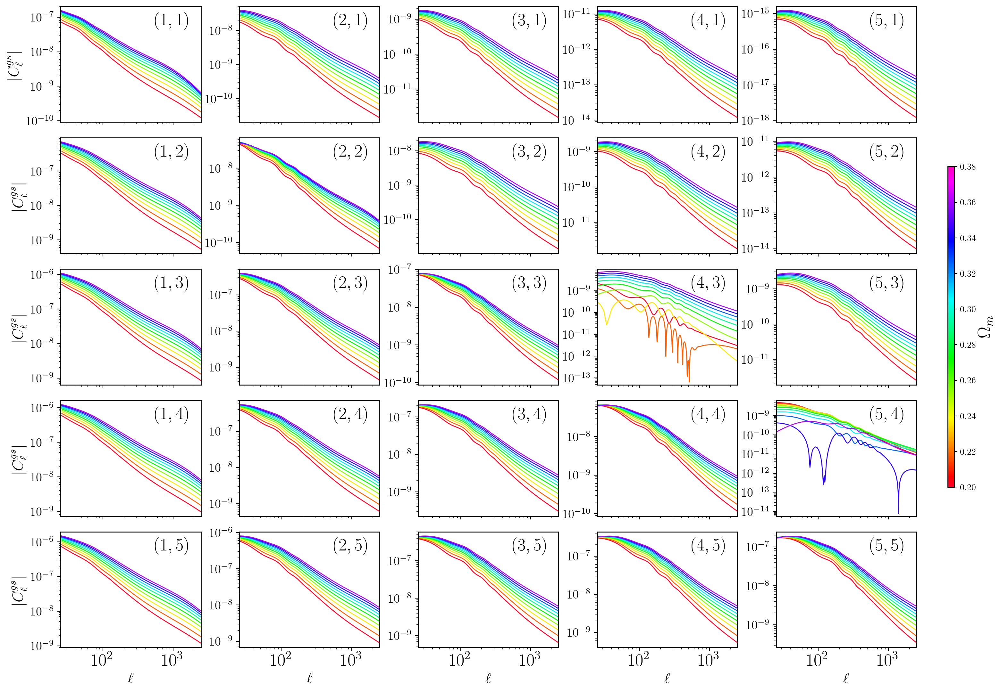

In [21]:
plot_C_gs_tomo_limber(ell=ell, C_gs=np.abs(C_gs), param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
                      lmin=ell[0],lmax=ell[len(ell)-1],
                      figsize = (21, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

In [28]:
ell = np.arange(25., 2500., 3.) # Make sure arange are with float numbers (otherwise there are aliasing problems)
param = np.arange(0.85, 1.1, 0.02)
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell, ns=x))

# Plot the Ratio over ref cosmology
ref = C_gs_tomo_limber(ell=ell)

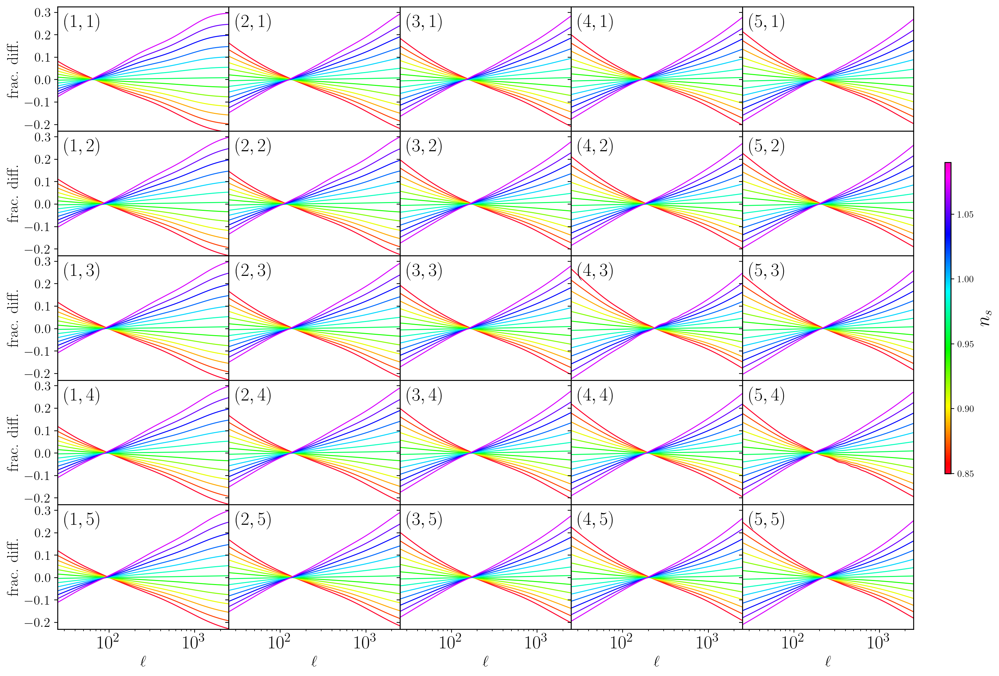

In [29]:
plot_C_gs_tomo_limber(ell=ell, C_gs=C_gs, C_gs_ref=ref, param=param, colorbarlabel="$n_s$", bintextpos = [0.15, 0.875], ylim = [0.77,1.325],
                     lmin=ell[0],lmax=ell[len(ell)-1],
                     figsize = (20, 12), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $\gamma_t(\theta)$

In [20]:
param = np.arange(0.2, 0.4, 0.02)   
gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(omegam = x))

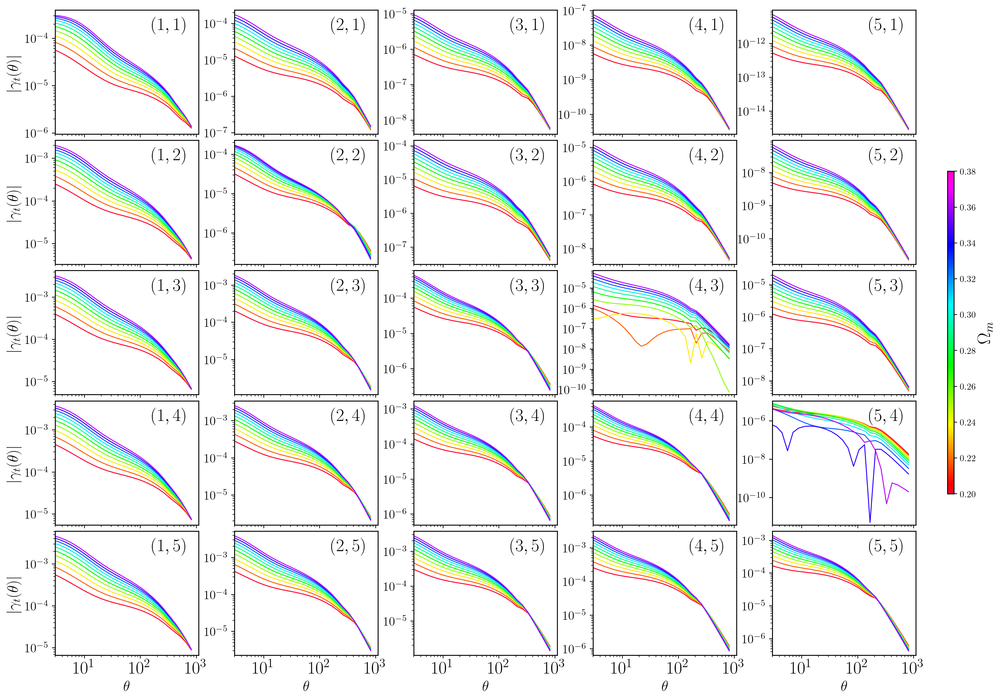

In [21]:
plot_gammat_tomo_limber(theta_gammat = gammat_theta, gammat_ref = None, param = param, colorbarlabel = "$\Omega_m$",
                       bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
                       figsize = (21, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Can we change the binning on $\gamma_t(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache internal variables

In [28]:
nthetas=[9, 12, 17, 44]
gammat_theta = []
for x in nthetas:
    gammat_theta.append(gamma_t(ntheta=x))

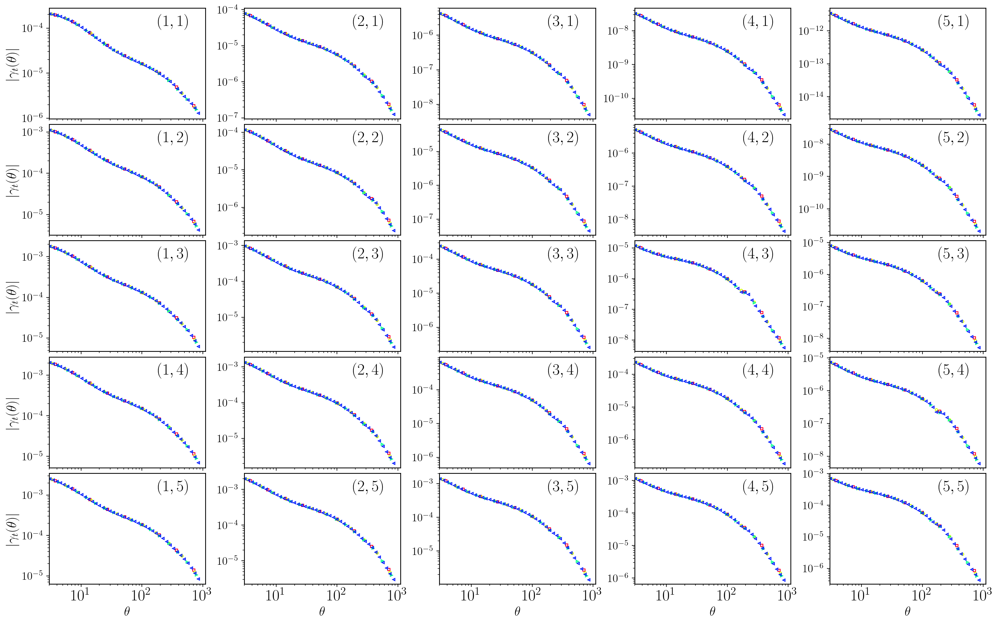

In [29]:
plot_gammat_tomo_limber(theta_gammat = gammat_theta, marker=['s', 'o', ">", "<"], ylim = [0.75,1.3], bintextpos = [0.8, 0.875],
                        figsize = (21, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Add Baryon Contamination to $C_{\ell}^{gs}$ and $\gamma_t(\theta)$ data vectors

In [23]:
ell = np.arange(3., 7500., 10.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
    
C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell,baryon_sims=x))
    
# Plot the Ratio over ref cosmology
C_gs_ref = C_gs_tomo_limber(ell=ell)

gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(baryon_sims=x, ntheta=40, AccuracyBoost=1.0))
gammat_theta_ref = gamma_t(ntheta=40, AccuracyBoost=1.0)

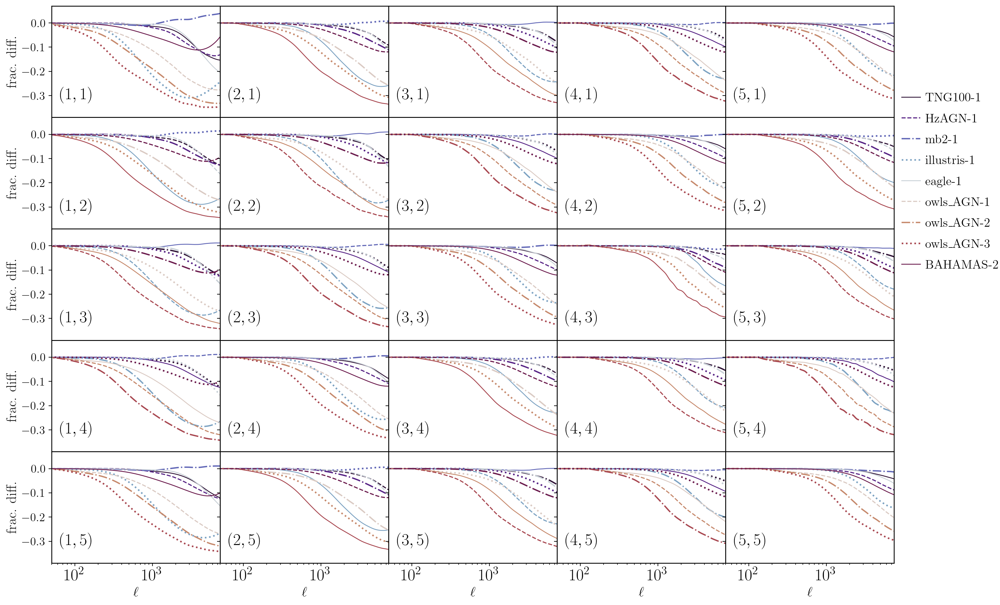

In [24]:
matplotlib.rcParams['legend.fontsize'] = 15
plot_C_gs_tomo_limber(ell=ell, C_gs=C_gs, C_gs_ref=C_gs_ref, lmin=50,lmax=ell[len(ell)-1], cmap="twilight_shifted", 
                      bintextpos = [0.15, 0.2], ylim = [0.61,1.07], legend = param, legendloc=(0.9,0.55),
                      linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                      figsize = (18, 12), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

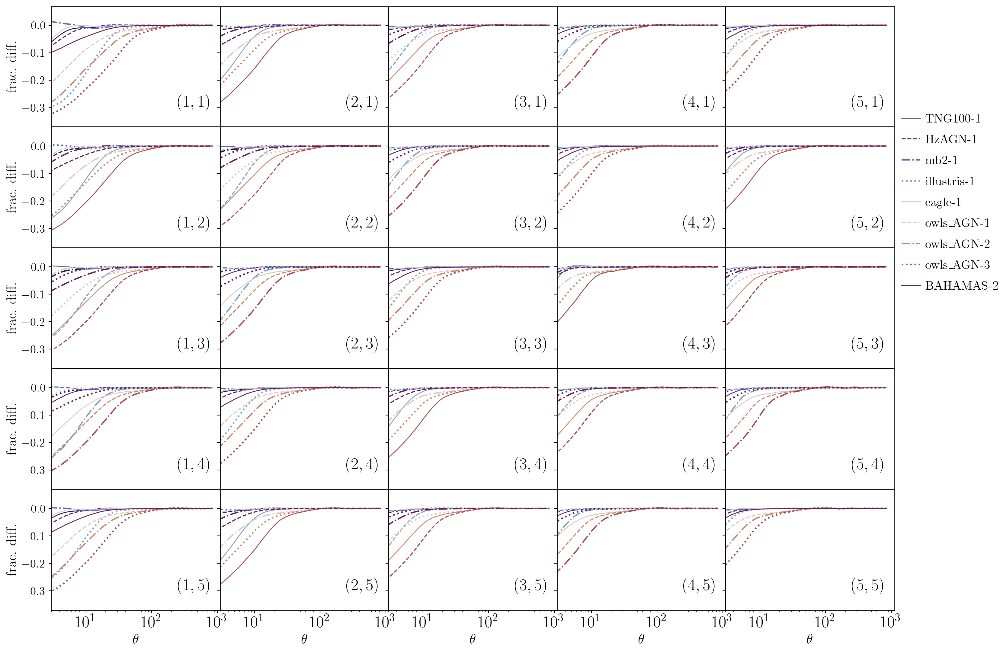

In [25]:
plot_gammat_tomo_limber(theta_gammat=gammat_theta, gammat_ref=gammat_theta_ref,cmap="twilight_shifted",
                       bintextpos = [0.85, 0.2], ylim = [0.63,1.07], legend = param, legendloc=(0.9,0.55),
                       linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                       figsize = (18, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm gs}$ and $\gamma_t(\theta)$ data vectors

In [53]:
ell = np.arange(10., 8500., 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0,6.0,0.5)

C_gs = []
for x in param:
    C_gs.append(C_gs_tomo_limber(ell=ell,AccuracyBoost=1.0,CAMBAccuracyBoost=1.+x/3.,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
    
# Plot the Ratio over ref cosmology
C_gs_ref = C_gs_tomo_limber(ell=ell,AccuracyBoost=1.0,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

gammat_theta = []
for x in param:
    gammat_theta.append(gamma_t(ntheta=40,AccuracyBoost=1.0,CAMBAccuracyBoost=1.+x/3.,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
gammat_theta_ref = gamma_t(ntheta=40,AccuracyBoost=1.0,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

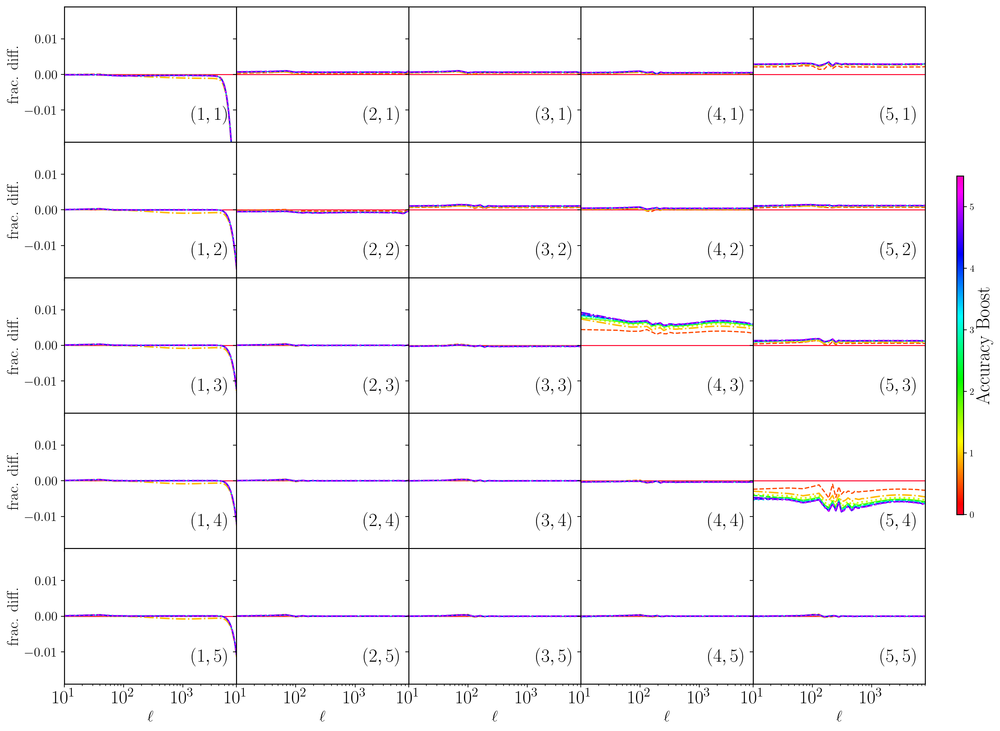

In [54]:
plot_C_gs_tomo_limber(ell=ell, C_gs=C_gs, C_gs_ref=C_gs_ref, param=param, lmin=10, lmax=8000, ylim=(0.981,1.019), bintextpos = [0.85, 0.2],
                      colorbarlabel="Accuracy Boost", linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                      figsize = (20, 13), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

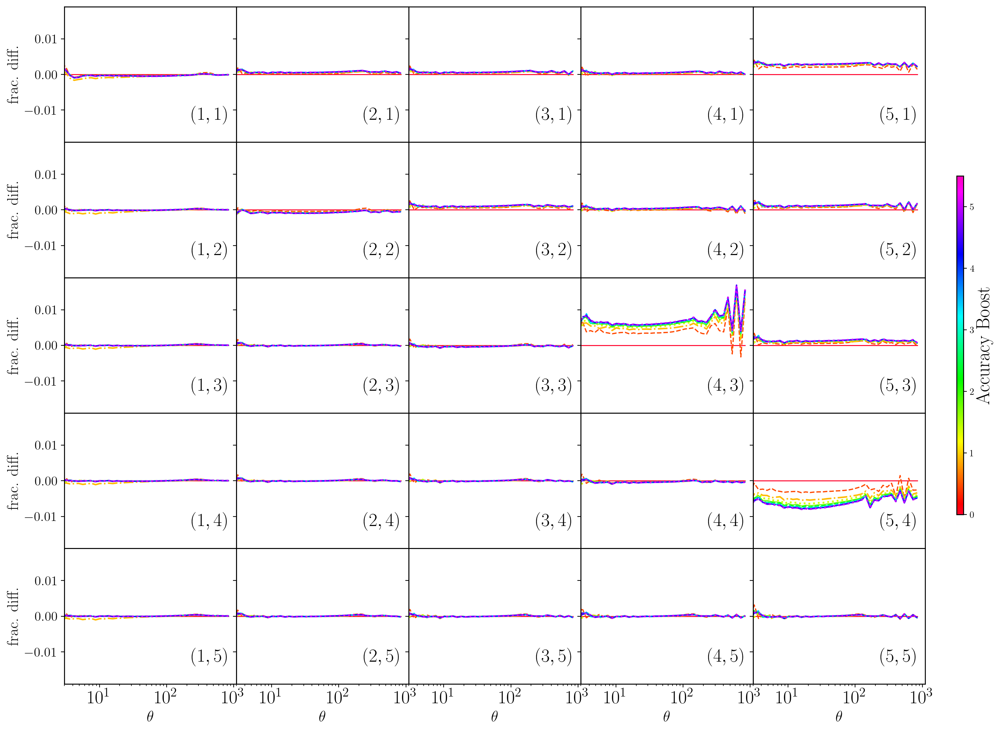

In [55]:
plot_gammat_tomo_limber(theta_gammat=gammat_theta, gammat_ref=gammat_theta_ref,
                       bintextpos = [0.85, 0.2], ylim = (0.981,1.019), param=param, legendloc=(0.9,0.55), colorbarlabel="Accuracy Boost",
                       linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                       figsize = (20, 13), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $C_{\ell}^{gg}$ (Non-Limber/Limber)

In [15]:
ell = np.arange(3., 2500., 3.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
C_gg_L = []
C_gg_NL = []
ratio = []
for x in param:
    tmp1 = C_gg_tomo(ell=ell, limber=1, omegam=x)
    tmp2 = C_gg_tomo(ell=ell, limber=0, omegam=x)
    C_gg_L.append(tmp1)
    C_gg_NL.append(tmp2)

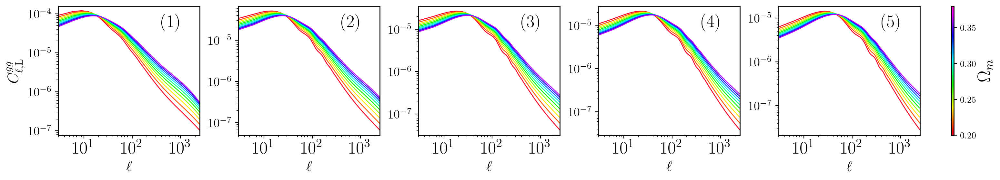

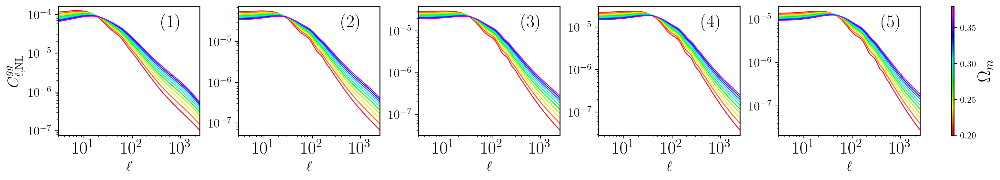

In [16]:
plot_C_gg_tomo(ell=ell, C_gg=C_gg_L, param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
               lmin=ell[0],lmax=ell[len(ell)-1], overwriteylabel="$C_{\ell,{\\rm L}}^{gg}$",
               figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)
plot_C_gg_tomo(ell=ell, C_gg=C_gg_NL, param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
               lmin=ell[0],lmax=ell[len(ell)-1], overwriteylabel="$C_{\ell,{\\rm NL}}^{gg}$",
               figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

In [17]:
ell = np.arange(3., 250., 1.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.2, 0.4, 0.02)
ratio = []
for x in param:
    tmp1 = C_gg_tomo(ell=ell, limber=1, omegam=x)
    tmp2 = C_gg_tomo(ell=ell, limber=0, omegam=x)
    ratio.append(tmp2/tmp1)

/tmp/ipykernel_643209/2098546462.py:7: RuntimeWarning: invalid value encountered in divide
  ratio.append(tmp2/tmp1)


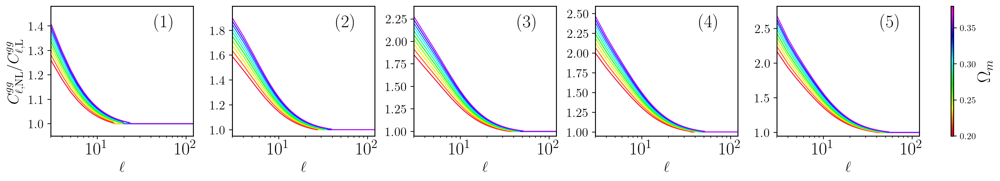

In [18]:
plot_C_gg_tomo(ell=ell, C_gg=ratio, param=param, colorbarlabel="$\Omega_m$", bintextpos = [0.8, 0.875], ylim = [0.95,1.05],
               lmin=3,lmax=120, forcelinearyscale=True, overwriteylabel="$C_{\ell,{\\rm NL}}^{gg}/C_{\ell,{\\rm L}}^{gg}$",
               forcelinearxscale=False, marker=None,
               figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's plot how cosmological and nuisance parameters affect $w(\theta)$

In [35]:
param = np.arange(0.2, 0.4, 0.02)   
wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(omegam = x))

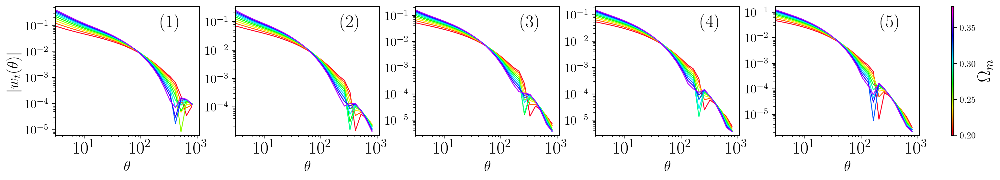

In [36]:
plot_wtheta_tomo(theta_wtheta = wtheta_theta, theta_wtheta_ref = None, param = param, colorbarlabel = "$\Omega_m$",
                 bintextpos = [0.8, 0.875], ylim = [0.75,1.3],
                 figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Can we change the binning on $w(\theta)$ w/o restarting the kernel? Yes!
Why this is a nontrivial question? Because Cosmolike uses static variables to cache internal variables

In [117]:
nthetas=[9, 12, 17, 44]
wtheta_theta = []
for x in nthetas:
    wtheta_theta.append(w_theta(ntheta=x))

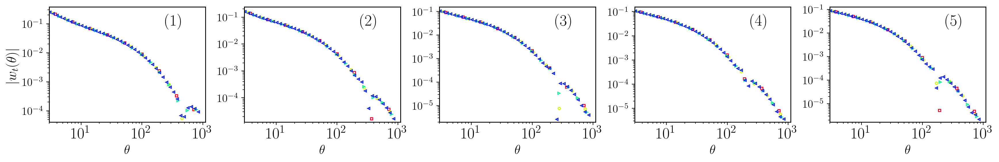

In [118]:
plot_wtheta_tomo(theta_wtheta=wtheta_theta, marker=['s', 'o', ">", "<"], ylim = [0.75,1.3], bintextpos = [0.8, 0.875],
                 figsize = (21, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Add Baryon Contamination to $C_{\ell}^{gg}$ and $w(\theta)$ data vectors

In [39]:
ell = np.arange(3., 7500., 10.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = ("TNG100-1", "HzAGN-1", "mb2-1", "illustris-1", "eagle-1", "owls_AGN-1", "owls_AGN-2", "owls_AGN-3", "BAHAMAS-2")
    
C_gg = []
for x in param:
    C_gg.append(C_gg_tomo(ell=ell,limber=False,baryon_sims=x))
    
# Plot the Ratio over ref cosmology
C_gg_ref = C_gg_tomo(ell=ell,limber=False)

wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(baryon_sims=x, ntheta=40, AccuracyBoost=1.0))
wtheta_theta_ref = w_theta(ntheta=40, AccuracyBoost=1.0)

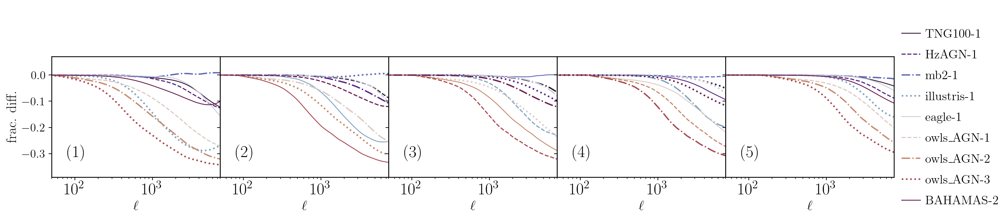

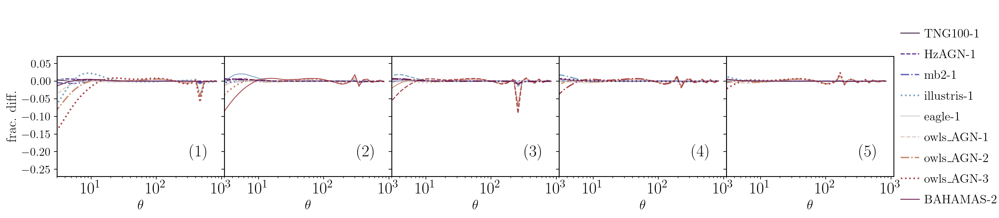

In [40]:
matplotlib.rcParams['legend.fontsize'] = 15
plot_C_gg_tomo(ell=ell, C_gg=C_gg, C_gg_ref=C_gg_ref, lmin=50,lmax=ell[len(ell)-1], cmap="twilight_shifted", 
               bintextpos = [0.15, 0.2], ylim = [0.61,1.07], legend = param, legendloc=(0.9,0.05),
               linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
               figsize = (18, 13./5), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)
plot_wtheta_tomo(theta_wtheta=wtheta_theta, theta_wtheta_ref=wtheta_theta_ref,cmap="twilight_shifted",
                 bintextpos = [0.85, 0.2], ylim = [0.73,1.07], legend = param, legendloc=(0.9,0.05),
                 linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                 figsize = (18, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Check how CAMB and Cosmolike Accuracy Boost affect $C_\ell^{\rm gg}$ and $w(\theta)$ data vectors

In [56]:
ell = np.arange(10., 8500., 30.) # Make sure np.arange are set w/ float numbers (otherwise there are aliasing problems)
param = np.arange(0.6,6.0,0.5)
C_gg = []
for x in param:
    C_gg.append(C_gg_tomo(ell=ell,limber=False,AccuracyBoost=1,CAMBAccuracyBoost=1.+x/3,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
    
# Plot the Ratio over ref cosmology
C_gg_ref = C_gg_tomo(ell=ell,limber=False,AccuracyBoost=1,CAMBAccuracyBoost=1.,CLAccuracyBoost=1,CLIntegrationAccuracy=0)

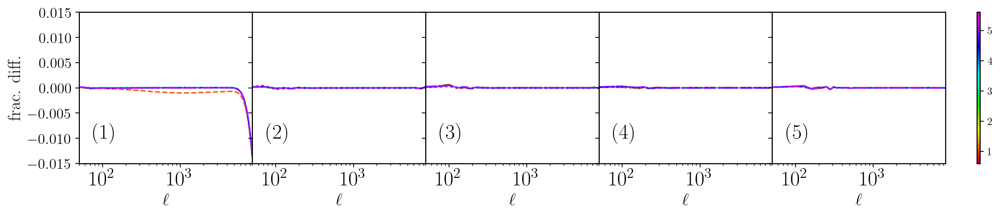

In [57]:
matplotlib.rcParams['legend.fontsize'] = 15
plot_C_gg_tomo(ell=ell, C_gg=C_gg, C_gg_ref=C_gg_ref, lmin=50,lmax=ell[len(ell)-1],
               bintextpos = [0.15, 0.2], ylim = [0.985,1.015], param = param, legendloc=(0.9,0.05),
               linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
               figsize = (18, 13./5), bintextsize = 20, yaxislabelsize = 17, yaxisticklabelsize = 14, xaxisticklabelsize = 20)

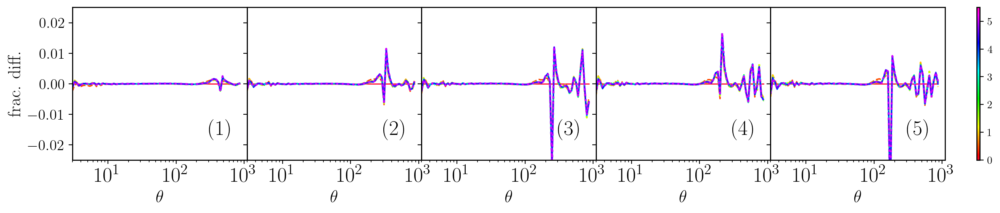

In [15]:
# HERE WE LEARN THAT FOR W(THETA), CAMB SHOULD HAVE ACCURACY BOOST=1.2
param = np.arange(0,6.0,0.5)

wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2+x/3,CLAccuracyBoost=1.0+x,CLIntegrationAccuracy=int(x)))
wtheta_theta_ref = w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2,CLAccuracyBoost=1.0,CLIntegrationAccuracy=0)
  
plot_wtheta_tomo(theta_wtheta=wtheta_theta, theta_wtheta_ref=wtheta_theta_ref, ylim = [0.975,1.025],
                 bintextpos = [0.85, 0.2], param = param, legendloc=(0.9,0.05),
                 linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                 figsize = (18, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20)

# Let's compute $\chi^2_{\rm LSST}$ and reproduce the results shown on EXAMPLE_EVALUATE2.YAML

In [27]:
CLprobe="3x2pt"
path= "../../external_modules/data/lsst_y1"
data_file="lsst_y1_M1_GGL0.05.dataset"

IA_model = 0
IA_redshift_evolution = 3
IA_code = 0

ini = IniFile(os.path.normpath(os.path.join(path, data_file)))

ci.initial_setup()

ci.init_probes(possible_probes = CLprobe)

ci.init_binning(int(ini.int("n_theta")), 
                ini.float("theta_min_arcmin"), 
                ini.float("theta_max_arcmin"))

ci.init_cosmo_runmode(is_linear = False)

ci.init_IA( ia_model = int(IA_model), 
            ia_redshift_evolution = int(IA_redshift_evolution),
            ia_code = int(IA_code))

ci.init_redshift_distributions_from_files(
      lens_multihisto_file=ini.relativeFileName('nz_lens_file'),
      lens_ntomo=int(ini.int("lens_ntomo")), 
      source_multihisto_file=ini.relativeFileName('nz_source_file'),
      source_ntomo=int(ini.int("source_ntomo")))

ci.init_data_real(ini.relativeFileName('cov_file'), 
                  ini.relativeFileName('mask_file'), 
                  ini.relativeFileName('data_file'))

if CLprobe != "xi":
    ci.init_bias(bias_model=[0,0,0,1,0])

def get_chi2(omegam = omegam, 
             omegab = omegab, 
             H0 = H0, 
             ns = ns, 
             As_1e9 = As_1e9, 
             w = w, 
             w0pwa = w0pwa,
             A1  = [LSST_A1_1, LSST_A1_2, 0, 0, 0], 
             A2  = [0, 0, 0, 0, 0],
             BTA = [0, 0, 0, 0, 0],
             shear_photoz_bias = [LSST_DZ_S1, LSST_DZ_S2, LSST_DZ_S3, LSST_DZ_S4, LSST_DZ_S5],
             M = [LSST_M1, LSST_M2, LSST_M3, LSST_M4, LSST_M5],
             lens_photoz_bias = [LSST_DZ_L1, LSST_DZ_L2, LSST_DZ_L3, LSST_DZ_L4, LSST_DZ_L5],
             galaxy_bias_b1 = [LSST_B1_1, LSST_B1_2, LSST_B1_3, LSST_B1_4, LSST_B1_5],
             galaxy_bias_b2 = [0,0,0,0,0],
             galaxy_bias_bmag = [0,0,0,0,0],
             galaxy_bias_b3nl = [0,0,0,0,0],
             galaxy_bias_bk = [0,0,0,0,0],
             PM = [LSST_PM_1, LSST_PM_2, LSST_PM_3, LSST_PM_4, LSST_PM_5],
             baryon_sims = None,
             AccuracyBoost=1.0, 
             kmax=5.0, 
             k_per_logint=10, 
             CAMBAccuracyBoost=1.0,
             CLAccuracyBoost=1.0, 
             CLIntegrationAccuracy = 0,
             non_linear_emul=non_linear_emul):

    CLAccuracyBoost = CLAccuracyBoost * AccuracyBoost
    CLIntegrationAccuracy = max(0, CLIntegrationAccuracy + 3*(CLAccuracyBoost-1.0))
    ci.init_ntable_lmax(int(50000+10000*CLAccuracyBoost))
    ci.init_accuracy_boost(CLAccuracyBoost, int(CLIntegrationAccuracy))

    # Set Nuisance Parameters
    (log10k_interp_2D, z_interp_2D, lnPL, lnPNL, G_growth, z_interp_1D, chi) = cnu.get_camb_cosmology(omegam=omegam, 
        omegab=omegab, H0=H0, ns=ns, As_1e9=As_1e9, w=w, w0pwa=w0pwa, mnu=mnu, AccuracyBoost=AccuracyBoost, kmax=kmax,
        k_per_logint=k_per_logint, CAMBAccuracyBoost=CAMBAccuracyBoost,
        CLAccuracyBoost=CLAccuracyBoost,non_linear_emul=non_linear_emul)
    
    ci.set_cosmology(omegam = omegam, 
                     H0 = H0, 
                     log10k_2D = log10k_interp_2D, 
                     z_2D = z_interp_2D, 
                     lnP_linear = lnPL,
                     lnP_nonlinear = lnPNL,
                     G = G_growth,
                     z_1D = z_interp_1D,
                     chi = chi)

    ci.set_nuisance_bias(B1 = galaxy_bias_b1,
                         B2 = galaxy_bias_b2,
                         B_MAG = galaxy_bias_bmag,
                         B3nl = galaxy_bias_b3nl,
                         BK = galaxy_bias_bk)

    ci.set_nuisance_clustering_photoz(bias = lens_photoz_bias)

    ci.set_point_mass(PMV=PM)
    
    ci.set_nuisance_shear_calib(M = M)

    ci.set_nuisance_shear_photoz(bias = shear_photoz_bias)

    ci.set_nuisance_ia(A1 = A1, 
                       A2 = A2, 
                       B_TA = BTA)

    datavector = np.array(ci.compute_data_vector_masked())
    return ci.compute_chi2(datavector)

In [23]:
print(rf"$\chi^2$={get_chi2():3.3f}")

$\chi^2$=0.425


# Let's compute $\chi^2_{\rm LSST}$ as function of CAMB and Cosmology Accuracy

In [24]:
param = np.arange(0,6,0.5)      
chi2 = []
for x in param:
    chi2.append(get_chi2(AccuracyBoost=1,CAMBAccuracyBoost=1.+x/3,CLAccuracyBoost=1+x,CLIntegrationAccuracy=int(x)))
chi2 = np.array(chi2)

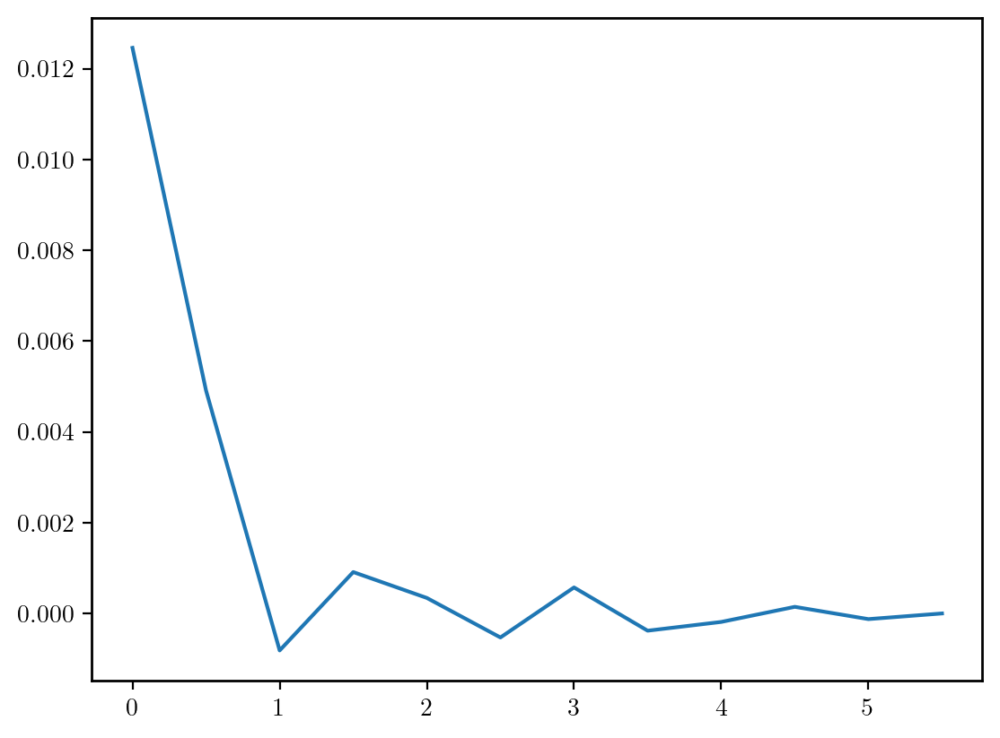

In [25]:
plt.plot(param, np.array(chi2-chi2[-1]))

# HALOFIT VS EE2

In [30]:
print(rf"$\chi^2$={get_chi2(non_linear_emul=1):3.3f}")
print(rf"$\chi^2$={get_chi2(non_linear_emul=2):3.3f}")

$\chi^2$=14.024
$\chi^2$=0.425


In [47]:
# HERE WE LEARN THAT FOR W(THETA), CAMB SHOULD HAVE ACCURACY BOOST=1.2
param = [1]
wtheta_theta = []
for x in param:
    wtheta_theta.append(w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=2))
wtheta_theta_ref = w_theta(ntheta=80,AccuracyBoost=1,CAMBAccuracyBoost=1.2,CLAccuracyBoost=1,CLIntegrationAccuracy=0,non_linear_emul=1)

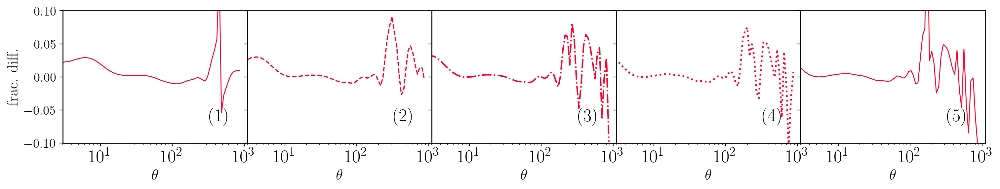

In [48]:
plot_wtheta_tomo(theta_wtheta=wtheta_theta, theta_wtheta_ref=wtheta_theta_ref, ylim = [0.9,1.1],
                 bintextpos = [0.85, 0.2], param = param, legendloc=(0.9,0.05),
                 linewidth=[1.0, 1.3, 1.6, 1.9], linestyle = ['solid', 'dashed', 'dashdot', 'dotted'],
                 figsize = (18, 13./5), bintextsize = 20,yaxislabelsize = 17,yaxisticklabelsize = 14, xaxisticklabelsize = 20,colorbar=None)